In [39]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

import pandas as pd

In [40]:
def create_perfect_grid(nhs, nvs, lw,sw):
    """
    nhs -  number of horizantal square
    nvs - number of vertical squares
    lw - line width
    sw - square width
    """
    xs =20
    ys= 20
    
    im = np.zeros((2*xs+ nvs*sw +lw, 2*ys+ nhs*sw + lw))
    for i in range(nhs+1):
        cv2.line(im, (xs+i*sw,ys), (xs+i*sw, im.shape[0]-ys-int(lw/2)), (255, 255, 255), thickness=lw)
           
    for i in range(nvs+1):
        cv2.line(im, (xs, ys+i*sw), (im.shape[1] -xs-int(lw/2), ys + i*sw), (255, 255, 255), thickness=lw) 
    return im

In [41]:
gridp = create_perfect_grid(42,43, 4,18)

In [42]:
20+18*42

776

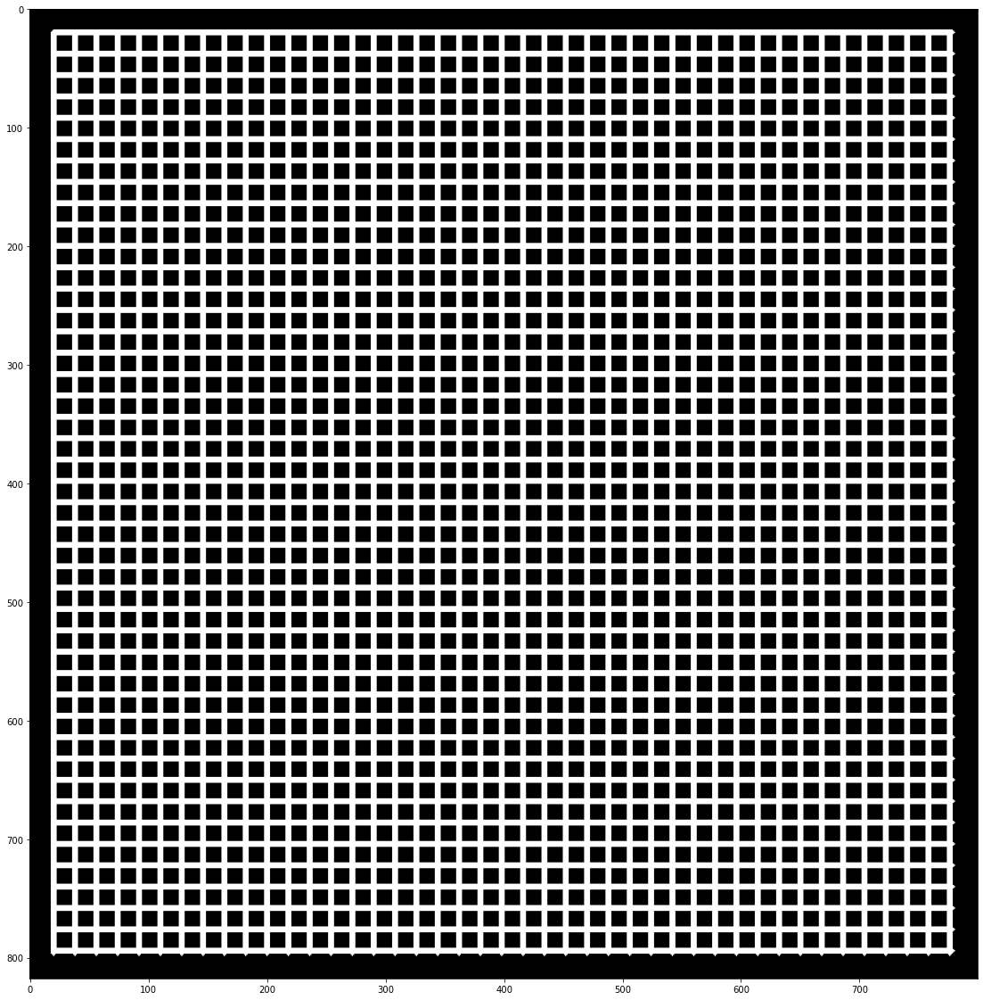

In [43]:
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(gridp , cmap="binary_r")

In [44]:
corners1 = np.asarray([[33,10], [796,21],[30,813], [793,818]])
corners2 = np.asarray([[20,20], [776,20],[20,794], [776,794]])
H, _ = cv2.findHomography(corners1, corners2)

In [54]:
grid = cv2.imread("grid16.tif", cv2.IMREAD_GRAYSCALE)

In [55]:
grid_warp = cv2.warpPerspective(grid, H, (grid.shape[1], grid.shape[0]))

In [56]:
cv2.imwrite("gridp.tif",gridp[20:794,20:776])
cv2.imwrite("grid16x.tif", grid_warp[20:794,20:776])

True

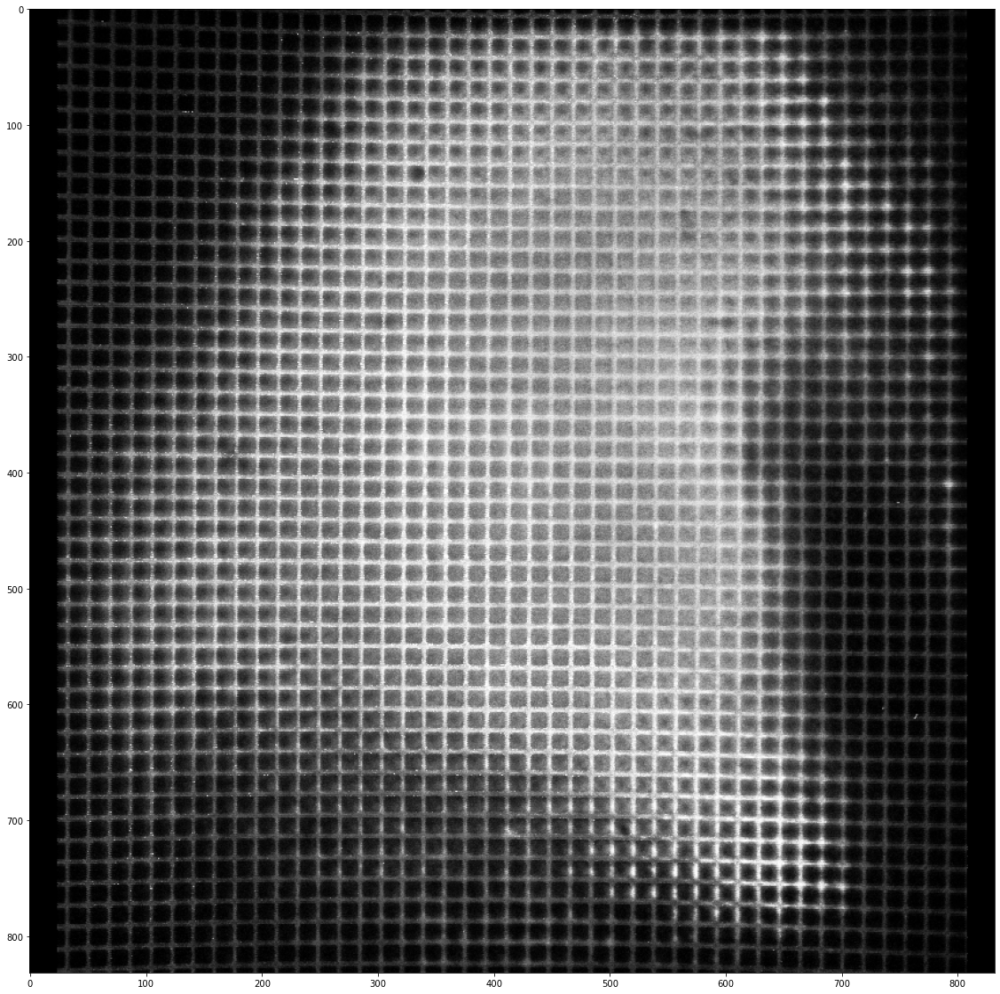

In [57]:
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid , cmap="binary_r")

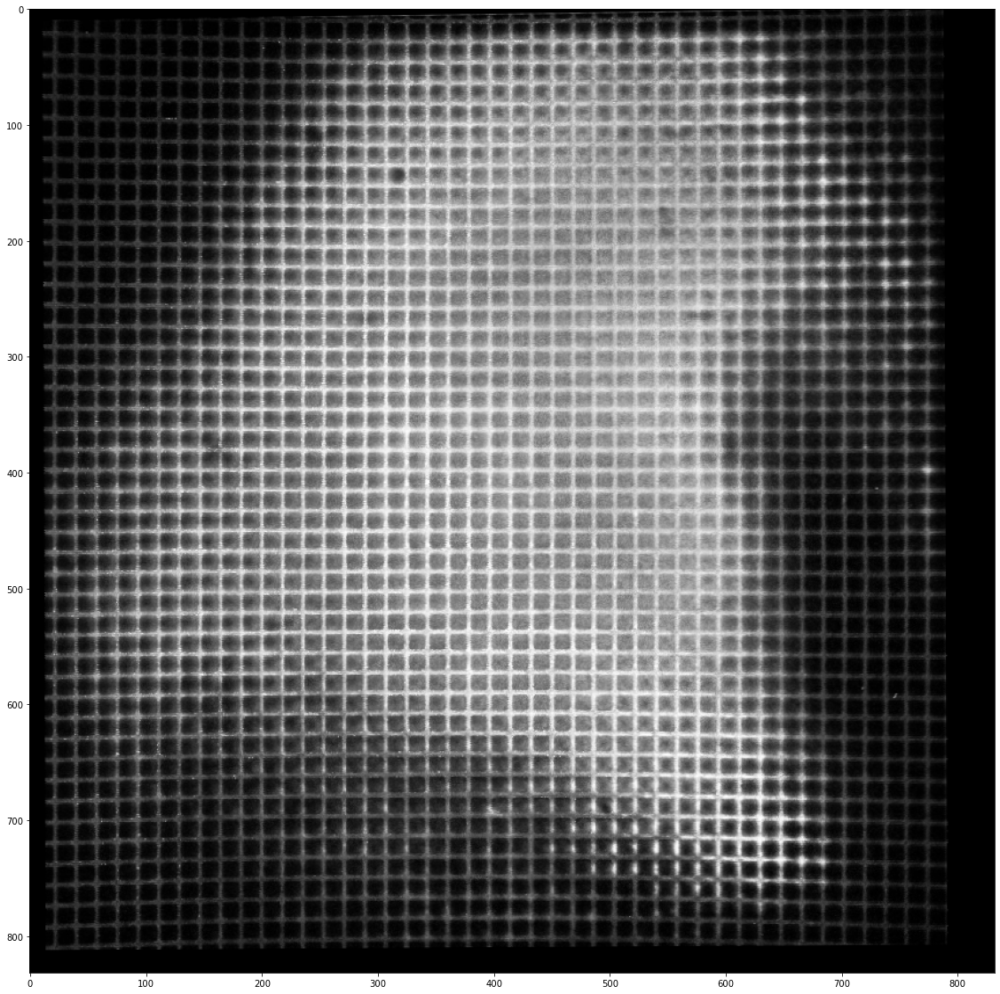

In [58]:
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid_warp , cmap="binary_r")

In [59]:
cv2.imwrite("gridp.tif",gridp[20:794,20:776])

True

In [60]:
grid = cv2.imread("grid16x.tif", cv2.IMREAD_GRAYSCALE)

In [61]:
gridp = gridp[20:794,20:776]
template = gridp[:18,:18]
template= template.astype(np.uint8)
w, h = template.shape[::-1]
res = cv2.matchTemplate(grid,template,method=cv2.TM_CCORR_NORMED)

In [62]:
threshold = 0.75
grid = cv2.cvtColor(grid,cv2.COLOR_GRAY2RGB)
loc = np.where( res >= threshold)

In [63]:
def getCenterPoint(pointS, pointList, thresh =4):
    pointSlist =[]
    for point in pointList:
        if abs(pointS[0]- point[0])<thresh and abs(pointS[1]- point[1])<thresh:
            pointSlist.append(point)
            pointList.remove(point)
    newPoint = np.mean(pointSlist, axis=0).astype(np.uint32)
    if(len(pointSlist)==0):
        newPoint = pointS
    return newPoint,pointList

In [64]:
pointList =[]
for pt in zip(*loc[::-1]):
    pointList.append(pt)

pointS = [0,0]
corners =[[pointS]]
nhs=42
nvs=43

for i in range(nvs):
    pointS = [corners[-1][0][0], corners[-1][0][1]+18]
    newPoint, pointList = getCenterPoint(pointS, pointList)
    if(len(newPoint)==1):
        corners.append([pointS])
    else:
        corners.append([newPoint])
for i, _ in enumerate(corners):
    for _ in range(nhs):
        pointS = [corners[i][-1][0]+18, corners[i][-1][1]]
        newPoint, pointList = getCenterPoint(pointS, pointList)
        if(len(newPoint)==1):
            corners[i].append(pointS)
        else:
            corners[i].append(newPoint)
lastrow=[]
for i in range(nhs):
        lastrow.append([corners[-2][i][0], corners[-2][i][1]+18])
corners[-1]=lastrow

C:\Users\atchu\anaconda3\envs\tissuecyte\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\atchu\anaconda3\envs\tissuecyte\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [66]:
grid = cv2.imread("grid16x.tif", cv2.IMREAD_GRAYSCALE)
grid = cv2.cvtColor(grid,cv2.COLOR_GRAY2RGB)
for pt in zip(*loc[::-1]):
    cv2.circle(grid, pt, radius=0, color=(0, 50, 50), thickness=-1)

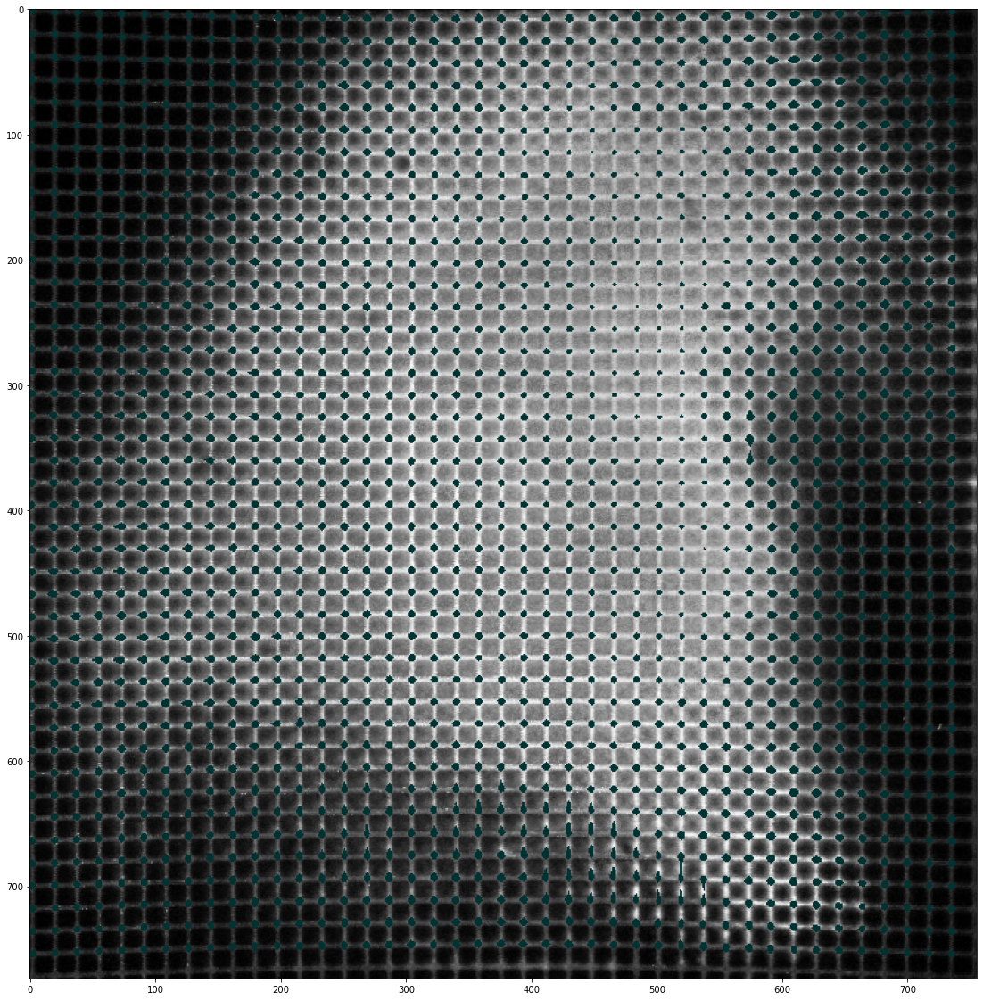

In [67]:
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid , cmap="binary_r")

In [68]:
for hlist in corners:
    for pt in hlist:
        cv2.circle(grid, pt, radius=0, color=(255,0,0), thickness=1)

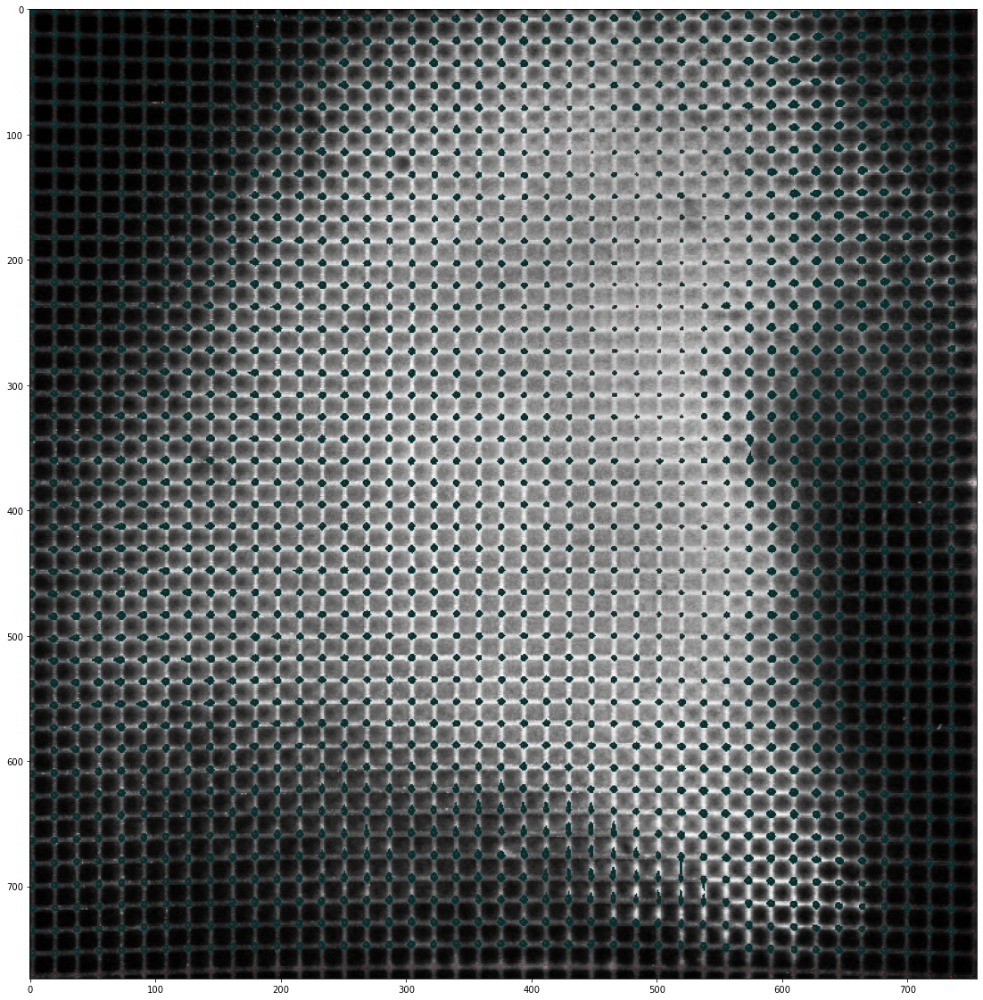

In [69]:
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid , cmap="binary_r")

In [17]:
import copy
corners_= copy.deepcopy(corners)
corners_[-1].append([grid.shape[0], grid.shape[1]])

In [18]:
corners = copy.deepcopy(corners_)
for i,hlist in enumerate(corners):
    for j,pt in enumerate(hlist):
        corners[i][j] = np.asarray(corners[i][j])
        corners[i][j] = corners[i][j].astype(np.float64)
        corners[i][j][0]  = (corners[i][j][0]- gridp.shape[1]/2)/float(gridp.shape[1])
        corners[i][j][1]  = (corners[i][j][1]- gridp.shape[0]/2)/float(gridp.shape[0])

xT = corners[int(nhs/2)][int(nvs/2)][0]
yT = corners[int(nhs/2)][int(nvs/2)][1]
for i,hlist in enumerate(corners):
    for j,pt in enumerate(hlist):
        corners[i][j][0] -= xT
        corners[i][j][1] -= yT

In [19]:
pointsX =[]
pointsY =[]
pointsX0=[]
pointsY0=[]

x0T = (int(nhs/2) *18 - gridp.shape[1]/2)/gridp.shape[1]
y0T = (int(nvs/2) *18 - gridp.shape[0]/2)/gridp.shape[0]
for i,hlist in enumerate(corners):
    for j,pt in enumerate(hlist):
        pointsX.append((j*18 - gridp.shape[1]/2)/gridp.shape[1])
        pointsX[-1] = pointsX[-1] - x0T
        pointsY.append((i*18 - gridp.shape[0]/2)/gridp.shape[0])
        pointsY[-1] = pointsY[-1] - y0T
        pointsX0.append(pt[0])
        pointsY0.append(pt[1])

In [20]:
ptX =[]
ptY =[]
ptX0=[]
ptY0=[]

x0T = (int(nhs/2) *18 - gridp.shape[1]/2)/gridp.shape[1]
y0T = (int(nvs/2) *18 - gridp.shape[0]/2)/gridp.shape[0]
for i,hlist in enumerate(corners):
    for j,pt in enumerate(hlist):
        ptX.append(j*18)
        ptY.append(i*18)
        ptX0.append(corners_[i][j][0])
        ptY0.append(corners_[i][j][1])

In [21]:
grid = cv2.imread("grid.tif", cv2.IMREAD_GRAYSCALE)
grid = cv2.cvtColor(grid,cv2.COLOR_GRAY2RGB)
i = int(nhs/2)
j = int(nvs/2)
cv2.line (grid , (i*18,j*18), (corners_[i][j][0],corners_[i][j][1]) ,color=(255,0,0), thickness=1 )
cv2.line (gridp , (i*18,j*18), (corners_[i][j][0],corners_[i][j][1]) ,color=(255,0,0), thickness=1 )

array([[255., 255., 255., ..., 255., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.],
       ...,
       [255., 255., 255., ...,   0., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.],
       [255., 255., 255., ..., 255., 255., 255.]])

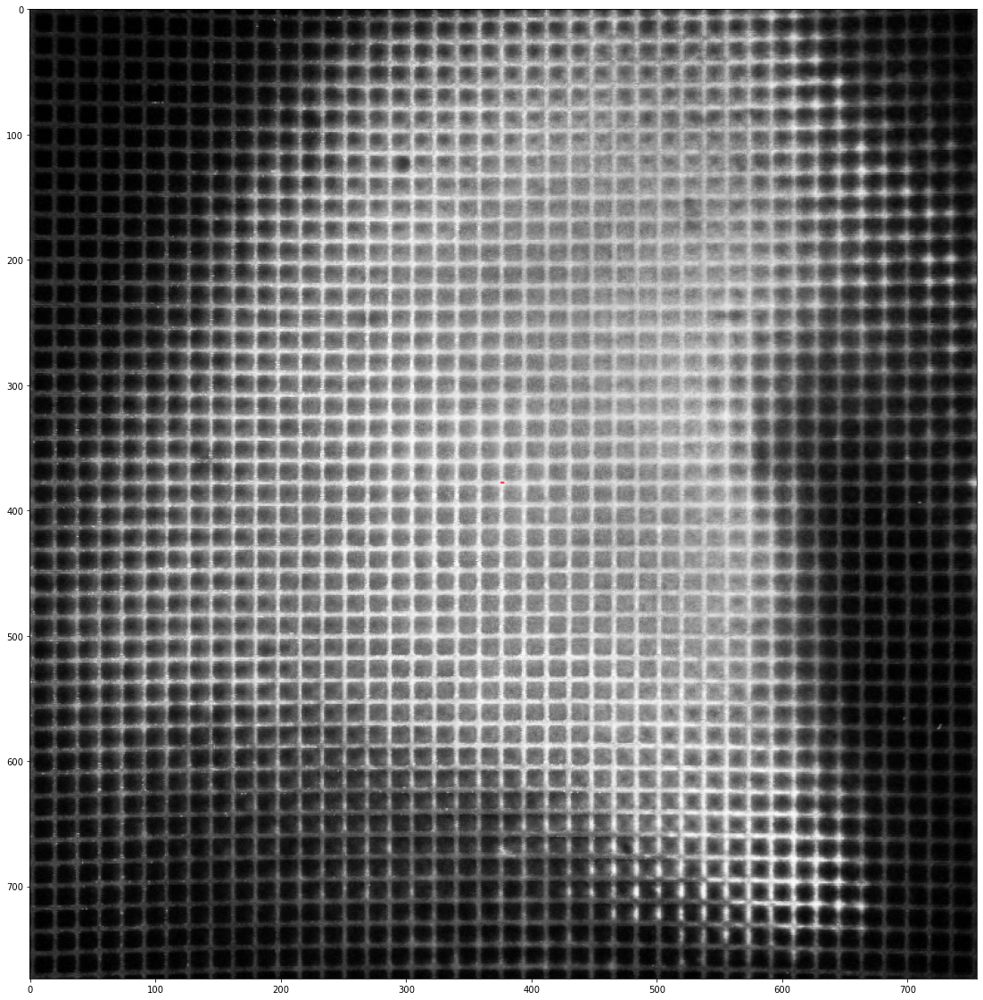

In [22]:
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid , cmap="binary_r")

In [23]:
markers = copy.deepcopy(corners_)
for i,hlist in enumerate(markers):
    markers[i] = np.asarray(markers[i])
    markers[i] = markers[i].astype(np.float64)
    for j,pt in enumerate(hlist):
        markers[i][j] +=[9,9]
        if(markers[i][j][0]>=grid.shape[1]):
            markers[i][j][0] = grid.shape[1]-1
        if(markers[i][j][1]>=grid.shape[0]):
            markers[i][j][1] = grid.shape[0]-1

In [24]:
for i,_ in enumerate(markers):
    markers[i] = np.insert(markers[i],0,[0,markers[i][0][1]],0)
    
hlist = copy.deepcopy(markers[0])    
markers.insert(0,hlist)
for pt in markers[0]:
    pt[1]=0

In [27]:
peaksY =[]
w=4
for j,pt in enumerate(markers[0][:-1]):
    for i,hlist in enumerate(markers[:-1]):
        x =  int(markers[i][j][0])
        y =  int(markers[i][j][1])
        ynext = int(markers[i+1][j][1])
        xnext  = int(markers[i][j+1][0])
        mean =0
        peak = y
        k = y
        while (k+w< ynext):
            #print(mean, np.mean(grid[y, k:k+w]), k)
            if(np.mean(grid[ k:k+w, x-3:x+3])> mean):
                peak = k
                mean = np.mean(grid[ k:k+w, x-3:x+3])
            k = k+1
        peaksY.append([x, peak])

In [28]:
peaksX =[]
w=3
for i,hlist in enumerate(markers[:-1]):
    for j,pt in enumerate(hlist[:-1]):
        x =  int(markers[i][j][0])
        y =  int(markers[i][j][1])
        xnext  = int(markers[i][j+1][0])
        upflag =1
        downflag =0
        mean = np.mean(grid[y, x:xnext])
        peak1 = x
        peak2 = xnext
        k = x
        while (k+w < xnext):
            #print(mean, np.mean(grid[y, k:k+w]), k)
            if (upflag):
                if(np.mean(grid[y, k:k+w])> mean):
                    peak1 = k
                    upflag =0
                    downflag =1
                
            if (downflag):
                if(np.mean(grid[y, k:k+w])< mean):
                    peak2 =k
                    downflag =0
            k = k+1
        peak =[int((peak1+peak2)/2)+1, y]
        peaksX.append(peak)

In [29]:
def get_peaks(xlist , thresh =13):
    l=[]
    for i,_ in enumerate(xlist[:-1]):
        l.append(-xlist[i][1] + xlist[i+1][1])
    thresh =  int(0.75* np.mean(l))
    xlist = sorted(xlist, reverse=True)
    newxlist =[]
    flag=1
    while(flag):
        newx=0
        flag=0
        for i, pt in enumerate(xlist):
            if(pt[1]!=0):
                newxlist.append([pt[1],pt[2]])
                newx = pt[1]
                flag=1
                break
        for i, pt in enumerate(xlist):
            if(abs(pt[1]-newx)<thresh):
                xlist[i][1] = 0
    newxlist = sorted(newxlist)
    return newxlist

In [30]:
peaksX =[]
peaksX_=[]
grid = cv2.imread("grid.tif", cv2.IMREAD_GRAYSCALE)
w=3
for i,hlist in enumerate(markers):
    xlist =[]
    xlist_=[]
    for j,pt in enumerate(hlist[:-1]):
        x =  int(markers[i][j][0])
        y =  int(markers[i][j][1])
        xnext  = int(markers[i][j+1][0])
        upflag =1
        downflag =0
        mean = np.mean(grid[y, x:xnext])
        peak1 = x
        peak2 = xnext
        k = x
        while (k+w < xnext):
            #print(mean, np.mean(grid[y, k:k+w]), k)
            if (upflag):
                if(np.mean(grid[y, k:k+w])> mean):
                    peak1 = k
                    upflag =0
                    downflag =1
            if (downflag):
                if(np.mean(grid[y, k:k+w])< mean):
                    peak2 =k
                    downflag =0
                    upflag=1
                    peak =[grid[y, int((peak1+peak2)/2)+1],int((peak1+peak2)/2)+1, y]
                    xlist.append(peak)
                    xlist_.append([int((peak1+peak2)/2)+1, y])
            k = k+1
        if(np.mean(grid[y, k-1:k-1+w])>= mean):
            peak =[grid[y, int((x+xnext)/2)+1],int((x+xnext)/2)+1, y]
            xlist.append(peak)
    newxlist = get_peaks(xlist)
    peaksX_.append(xlist_)
    peaksX.append(newxlist)

In [31]:
peaksY =[]
grid = cv2.imread("grid.tif", cv2.IMREAD_GRAYSCALE)
w=3
for j,pt in enumerate(markers[0]):
    ylist =[]
    for i,hlist in enumerate(markers[:-1]):
        x =  int(markers[i][j][0])
        y =  int(markers[i][j][1])
        ynext  = int(markers[i+1][j][1])
        upflag =1
        downflag =0
        mean = np.mean(grid[y:ynext, x])
        peak1 = y
        peak2 = ynext
        k = y
        while (k+w < ynext):
            #print(mean, np.mean(grid[ k:k+w,x]), k,upflag)
            if (upflag):
                if(np.mean(grid[ k:k+w,x])> mean):
                    peak1 = k
                    upflag =0
                    downflag =1
            if (downflag):
                if(np.mean(grid[ k:k+w,x])< mean):
                    peak2 =k
                    downflag =0
                    upflag=1
                    peak =[grid[int((peak1+peak2)/2)+1,x],int((peak1+peak2)/2)+1,x ]
                    ylist.append(peak)
            k = k+1
        if(np.mean(grid[k:k+w,x])>= mean):
            peak =[grid[ int((y+ynext)/2)+1,x],int((y+ynext)/2)+1, x]
            ylist.append(peak)
    newylist = get_peaks(ylist)
    peaksY.append(np.asarray(newylist))

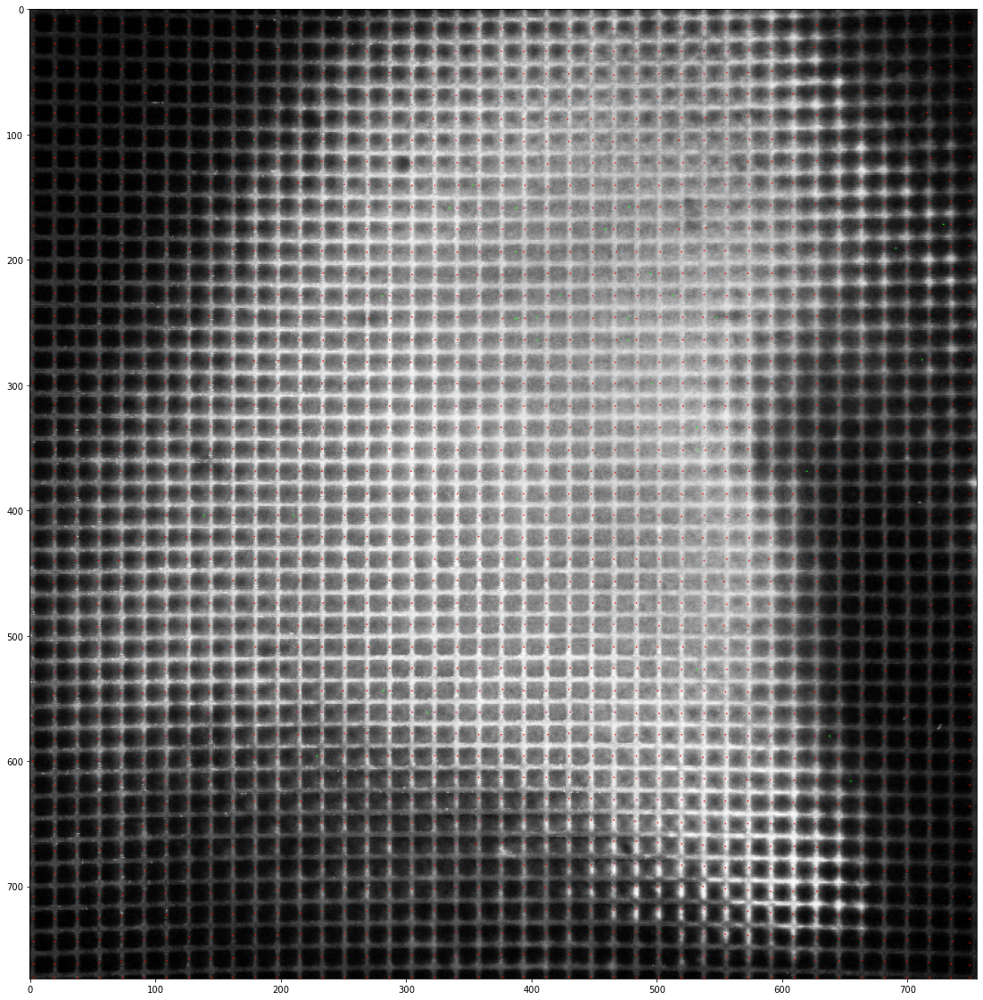

In [32]:
grid = cv2.imread("grid.tif", cv2.IMREAD_GRAYSCALE)
grid = cv2.cvtColor(grid,cv2.COLOR_GRAY2RGB)

for xlist in peaksX_:
    for pt in xlist:
        cv2.circle(grid, (int(pt[0]),int(pt[1])), radius=0, color=(0,255,0), thickness=1)

for xlist in peaksX:
    for pt in xlist:
        cv2.circle(grid, (int(pt[0]),int(pt[1])), radius=0, color=(255,0,0), thickness=1)

fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid , cmap="binary_r")

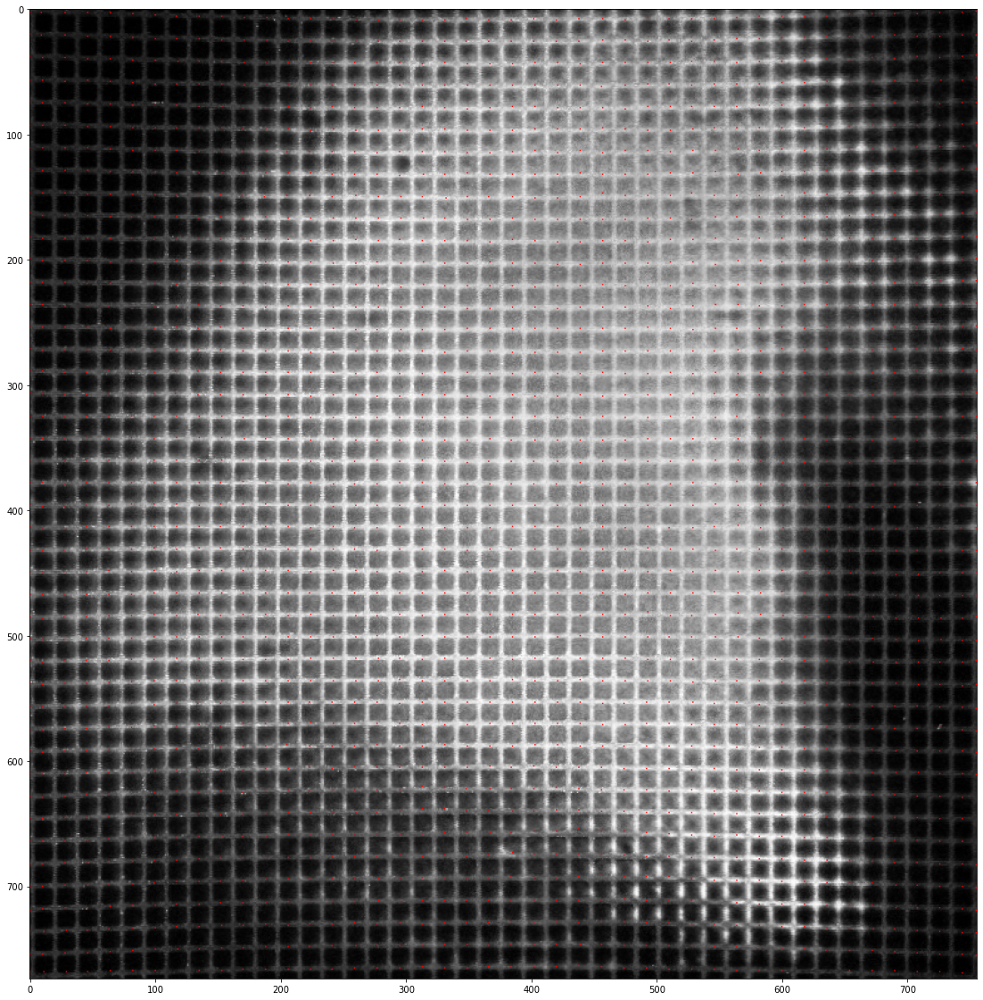

In [33]:
grid = cv2.imread("grid.tif", cv2.IMREAD_GRAYSCALE)
grid = cv2.cvtColor(grid,cv2.COLOR_GRAY2RGB)
for ylist in peaksY:
    for pt in ylist:
        cv2.circle(grid, (int(pt[1]),int(pt[0])), radius=0, color=(255,0,0), thickness=1)
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid , cmap="binary_r")

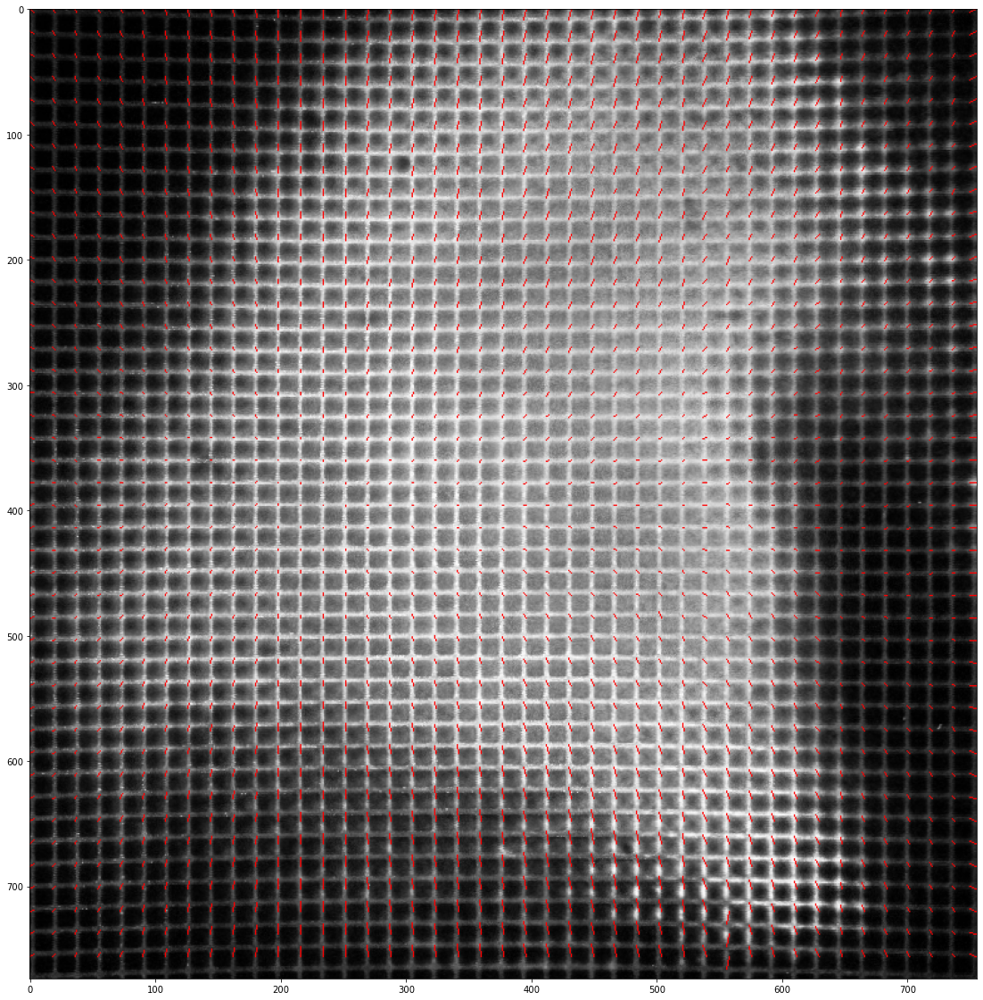

In [34]:
grid = cv2.imread("grid.tif", cv2.IMREAD_GRAYSCALE)
grid = cv2.cvtColor(grid,cv2.COLOR_GRAY2RGB)
for j,_ in enumerate(peaksY[:-1]):
    for i,pt in enumerate(peaksX[0]):
        cv2.line (grid , (i*18,j*18),(int(pt[0]),int(peaksY[i][j][0])) ,color=(255,0,0), thickness=1 )
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(grid , cmap="binary_r")

In [35]:
import numpy as np
import scipy.stats
from scipy.special import binom

def bernstein(u, n, k):
    return binom(n,k) * u**k * (1-u) **(n-k)

def barray(u,v, n,m):
    bmatrix =np.zeros((len(u), (n+1)*(m+1)))
    for i in range(n+1):
        for j in range(m+1):
            bmatrix[:,i*(m+1) + j] = bernstein(u,n,i)* bernstein(v,m,j)
            #blist.append(bernstein(u,n,i)* bernstein(v,m,j))
    return bmatrix

In [36]:
pX  =[]
pY  =[]
pX0 =[]
pY0 =[]
for j,_ in enumerate(peaksY[:-1]):
    for i,pt in enumerate(peaksX[0]):
        pX.append(i*18 /gridp.shape[1])
        pY.append(j*18 /gridp.shape[0])
        pX0.append((int(pt[0])/gridp.shape[1]))
        pY0.append((int(peaksY[i][j][0])/gridp.shape[0]))

pX= np.asarray(pX)
pX0= np.asarray(pX0)
pY= np.asarray(pY)
pY0= np.asarray(pY0)

In [37]:
bmatrix = barray(pX,pY,4,4)

In [38]:
kx = np.linalg.lstsq(bmatrix, pX0)[0]
ky = np.linalg.lstsq(bmatrix, pY0)[0]

C:\Users\atchu\AppData\Local\Temp\ipykernel_57312\3432196678.py:1: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  kx = np.linalg.lstsq(bmatrix, pX0)[0]
C:\Users\atchu\AppData\Local\Temp\ipykernel_57312\3432196678.py:2: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  ky = np.linalg.lstsq(bmatrix, pY0)[0]


In [39]:
grid = cv2.imread("grid.tif", cv2.IMREAD_GRAYSCALE)
im = np.zeros(gridp.shape).astype(np.float64)
px=[]
py=[]
for i in range(im.shape[0]):
    for j in range(im.shape[1]):
        px.append(j)
        py.append(i)
px = np.asarray(px)
py = np.asarray(py)
px_ = np.asarray(px/float(gridp.shape[1]))
py_ = np.asarray(py/float(gridp.shape[0]))

pX_ = np.matmul(barray(px_,py_,4,4),kx)
pY_ = np.matmul(barray(px_,py_,4,4),ky)

pX_ = pX_ * gridp.shape[1] 
pY_ = pY_ * gridp.shape[0]
pX_[pX_<=0] = 0
pX_[pX_>=gridp.shape[1]] = gridp.shape[1]-1
pY_[pY_<=0] = 0
pY_[pY_>=gridp.shape[0]] = gridp.shape[0]-1
for i,_ in enumerate(px):
    im[py[i]][px[i]] = grid[int(pY_[i])][int(pX_[i])]

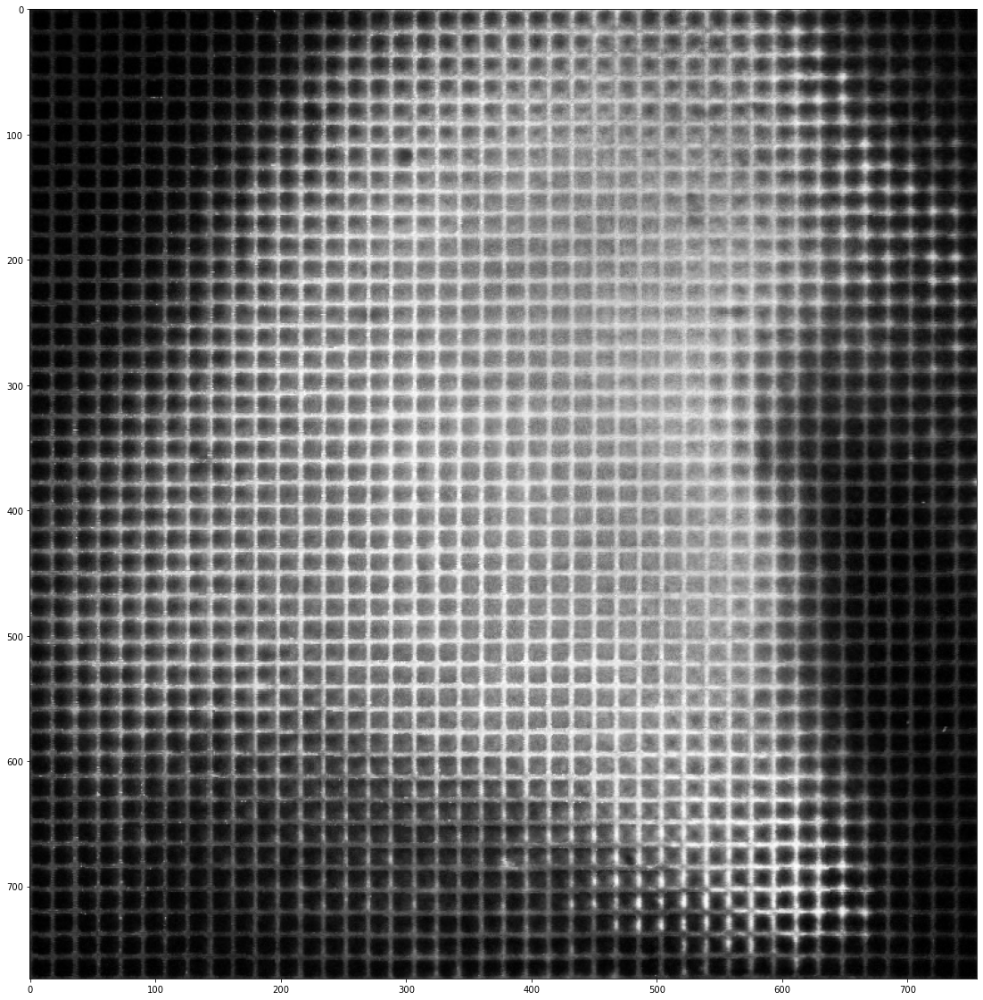

In [40]:
fig,ax = plt.subplots(1,1, figsize=(20,20))
ax.imshow(im , cmap="binary_r")

In [41]:
import joblib
joblib.dump([kx,ky], "bezier16x.pkl" )

['bezier16x.pkl']

In [74]:
gridp.shape

TypeError: can't multiply sequence by non-int of type 'list'

In [ ]:
def correct_deformation(im0,template, H, kx, ky):
    im_warp = cv2.warpPerspective(im0, H, (im0.shape[1], im0.shape[0]))
    im_warp = im_warp[20:794,20:776]
    im = np.zeros(tuple(2*x for x in template.shape)).astype(np.float64)
    px=[]
    py=[]
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            px.append(j)
            py.append(i)
    px = np.asarray(px)
    py = np.asarray(py)
    px_ = np.asarray(px/float(template.shape[1]))
    py_ = np.asarray(py/float(template.shape[0]))

    pX_ = np.matmul(barray(px_,py_,4,4),kx)
    pY_ = np.matmul(barray(px_,py_,4,4),ky)

    pX_ = pX_ * template.shape[1] 
    pY_ = pY_ * template.shape[0]
    pX_[pX_<=0] = 0
    pX_[pX_>=template.shape[1]] = template.shape[1]-1
    pY_[pY_<=0] = 0
    pY_[pY_>=template.shape[0]] = template.shape[0]-1
    for i,_ in enumerate(px):
        x1 = floor(pX_[i])
        x2 = ceil(pX_[i])
        y1 = floor(pY_[i])
        y2 = ceil(pY_[i])
        
        dx1 = pX_[i] - x1
        dx2 = x2 - pX_[i]
        
        dy1 = pY_[i] - y1
        dy2 = y2 - pY_[i]
        
        if y1 == y2:
            dx1 =1
        if x1 == x2:
            dy1 =1
        im[py[i]][px[i]] = im_warp[y1][x1] * dx1*dy1 +im_warp[y1][x2] *dx2*dy1+im_warp[y2][x1]*dy2*dx1+im_warp[y2][x2]*dy2*dx2        
    return im

In [1053]:
barray(px_,py_,4,4).shape

(554944, 16)

In [1056]:
np.matmul(barray(px_,py_,4,4),kx).shape

(554944,)

In [1075]:
cv2.imwrite("grid_test.tif", im)

True